Hypothesis:

Problem Statement: High node temperatures in Kubernetes clusters can lead to performance issues, hardware failures, and potencial increased costs. By predicting node temperatures using system metrics, we can manage resources proactively and avoid overheating.

Hypothesis: We hypothesize that node_temperature can be predicted based on real-time resource usage, such as CPU and memory usage, disk I/O, network latency, and scaling events. We think that higher CPU and memory loads and network activity are expected to correlate with increases in node temperature.

# 1. Imports and load datasets

In [317]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.decomposition import PCA
from sklearn.preprocessing import QuantileTransformer

from sklearn.linear_model import LinearRegression
from sklearn import tree
from sklearn.preprocessing import PolynomialFeatures
from sklearn.neural_network import MLPRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import mean_squared_error, r2_score

from joblib import dump

In [5]:
data_performance = pd.read_csv('kubernetes_performance_metrics_dataset.csv')
data_resource = pd.read_csv('kubernetes_resource_allocation_dataset.csv')

In [6]:
data_performance

,timestamp,pod_name,namespace,cpu_allocation_efficiency,memory_allocation_efficiency,disk_io,network_latency,node_temperature,node_cpu_usage,node_memory_usage,event_type,event_message,scaling_event,pod_lifetime_seconds
0,01/01/2023 00:00,pod_0,dev,0.038162,0.949259,9.993579,13.722542,77.619073,93.177619,37.900532,Warning,Killed,False,119648
1,01/01/2023 00:00,pod_1,default,0.500763,0.048543,935.792442,55.493953,84.182245,61.442289,5.208161,Error,Failed,True,144516
2,01/01/2023 00:00,pod_2,kube-system,0.746726,0.447345,328.352359,173.910016,21.295244,55.819311,18.335802,Normal,Completed,True,68857
3,01/01/2023 00:00,pod_3,default,0.526692,0.870251,778.297708,67.395729,85.028829,78.968463,94.619689,Warning,OOMKilled,True,72080
4,01/01/2023 00:00,pod_4,prod,0.425342,0.885459,711.181295,91.724730,29.157695,52.718141,70.770594,Error,Killed,False,123016
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14995,01/01/2023 04:09,pod_14995,kube-system,0.020767,0.697208,379.511285,147.031290,66.820729,23.681710,65.269283,Normal,Started,True,111871
14996,01/01/2023 04:09,pod_14996,default,0.026490,0.973705,93.014634,80.106794,21.358463,22.612871,48.674617,Normal,Started,False,64848
14997,01/01/2023 04:09,pod_14997,dev,0.321295,0.073787,112.686558,83.621580,70.648406,74.516728,76.802551,Error,Failed,True,126843
14998,01/01/2023 04:09,pod_14998,kube-system,0.087156,0.322506,804.890194,158.398994,41.005118,58.788146,53.529527,Warning,Started,False,137157


In [7]:
data_resource

,pod_name,namespace,cpu_request,cpu_limit,memory_request,memory_limit,cpu_usage,memory_usage,node_name,pod_status,restart_count,uptime_seconds,deployment_strategy,scaling_policy,network_bandwidth_usage
0,pod_0,dev,1.569542,3.679152,3174.582783,5134.413852,3.345496,2135.310365,node_12,Failed,0,76536,RollingUpdate,Manual,459.015733
1,pod_1,default,0.343119,3.722716,3551.459173,3698.349366,2.758188,7442.200271,node_18,Unknown,2,97849,RollingUpdate,Manual,507.770808
2,pod_2,kube-system,0.249271,1.318147,1578.313253,7418.271122,1.319703,5142.897754,node_7,Failed,2,47370,RollingUpdate,Manual,527.702531
3,pod_3,default,0.311497,2.852595,1392.962372,3628.480705,3.752312,2952.449331,node_20,Failed,6,5685,Recreate,Auto,473.530315
4,pod_4,default,1.532775,0.521618,2660.192655,5091.497752,0.874224,3382.299355,node_38,Unknown,3,4502,Recreate,Auto,973.928080
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14995,pod_14995,default,1.997695,1.577334,2920.681723,3301.505670,3.687516,1507.814693,node_2,Pending,7,20400,RollingUpdate,Manual,507.999608
14996,pod_14996,kube-system,0.425630,0.560789,1697.207347,2236.889119,1.936231,2912.361420,node_48,Failed,2,30947,RollingUpdate,Auto,769.573808
14997,pod_14997,dev,0.796528,0.703669,2756.252091,4037.078898,0.520359,6014.724989,node_34,Pending,5,33869,RollingUpdate,Auto,453.813279
14998,pod_14998,prod,1.067521,0.649056,1393.688808,6603.447250,2.043006,882.132829,node_5,Unknown,1,17293,Recreate,Auto,940.724094


# 2. Explore rows with missing data

There appears to be no missing data in the data sets.

In [10]:
missing_p = len(data_performance[data_performance.isnull().any(axis=1)])
missing_r = len(data_resource[data_resource.isnull().any(axis=1)])

print("Number of rows with missing data in performance:", missing_p)
print("Number of rows with missing data in resource:", missing_r)

Number of rows with missing data in performance: 0
Number of rows with missing data in resource: 0


# 3. Merge datasets

To merge the datasets we use the unique column "pod_name" as the key.

In [13]:
data = pd.merge(data_performance, data_resource, on="pod_name")

In [14]:
data.head()

,timestamp,pod_name,namespace_x,cpu_allocation_efficiency,memory_allocation_efficiency,disk_io,network_latency,node_temperature,node_cpu_usage,node_memory_usage,...,memory_limit,cpu_usage,memory_usage,node_name,pod_status,restart_count,uptime_seconds,deployment_strategy,scaling_policy,network_bandwidth_usage
0,01/01/2023 00:00,pod_0,dev,0.038162,0.949259,9.993579,13.722542,77.619073,93.177619,37.900532,...,5134.413852,3.345496,2135.310365,node_12,Failed,0,76536,RollingUpdate,Manual,459.015733
1,01/01/2023 00:00,pod_1,default,0.500763,0.048543,935.792442,55.493953,84.182245,61.442289,5.208161,...,3698.349366,2.758188,7442.200271,node_18,Unknown,2,97849,RollingUpdate,Manual,507.770808
2,01/01/2023 00:00,pod_2,kube-system,0.746726,0.447345,328.352359,173.910016,21.295244,55.819311,18.335802,...,7418.271122,1.319703,5142.897754,node_7,Failed,2,47370,RollingUpdate,Manual,527.702531
3,01/01/2023 00:00,pod_3,default,0.526692,0.870251,778.297708,67.395729,85.028829,78.968463,94.619689,...,3628.480705,3.752312,2952.449331,node_20,Failed,6,5685,Recreate,Auto,473.530315
4,01/01/2023 00:00,pod_4,prod,0.425342,0.885459,711.181295,91.724730,29.157695,52.718141,70.770594,...,5091.497752,0.874224,3382.299355,node_38,Unknown,3,4502,Recreate,Auto,973.928080


# 4. Data cleaning

Why do we delete these columns:

- Timestamp: 

We assume that timestamp represents when the data is taken. This is irrelavent to predict node temperature.

- Pod name:

Pod name a unique identifier for each row.

- Namespace:

Our hypothesis is to predict node temprature based on resource usage. This columns is not relavent to resource usage. So we remove this columns.

- Pod status:

Our hypothesis is to predict node temprature based on resource usage. This column is not relavent to resource usage. So we remove this column.

- Node name:

Node name is a uniqe identifier for each node and are irrelavent to resource usage. So we remove this column.

- Deployment strategy:

This column is not relavent to resource usage. So we remove this column.

- Scaling policy:

This column is not relavent to resource usage. So we remove this column.

- Network latency:

This column is not relavent to resource usage. So we remove this column.

- Pod lifetime seconds:

This column is not relavent to resource usage since it seem to be indicating how long the pod has been running. So we remove this column.

- Scaling event:

This column is not relavent to resource usage since it indicates if the pod is being scaled. So we remove this column.


In [17]:
col_to_delete = [
    "timestamp",
    "pod_name",
    "namespace_x",
    "namespace_y",
    "pod_status",
    "node_name",
    "deployment_strategy",
    "scaling_policy",
    "network_latency",
    "pod_lifetime_seconds",
    "scaling_event",
]

Removing the columns

In [19]:
data.drop(col_to_delete, inplace=True, axis=1)
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 17 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   cpu_allocation_efficiency     15000 non-null  float64
 1   memory_allocation_efficiency  15000 non-null  float64
 2   disk_io                       15000 non-null  float64
 3   node_temperature              15000 non-null  float64
 4   node_cpu_usage                15000 non-null  float64
 5   node_memory_usage             15000 non-null  float64
 6   event_type                    15000 non-null  object 
 7   event_message                 15000 non-null  object 
 8   cpu_request                   15000 non-null  float64
 9   cpu_limit                     15000 non-null  float64
 10  memory_request                15000 non-null  float64
 11  memory_limit                  15000 non-null  float64
 12  cpu_usage                     15000 non-null  float64
 13  m

# 5. Data exploration

## 5.1. Correlations

Create a correlation matrix between all numeric columns

In [23]:
corr_matrix = data.select_dtypes(include=['number']).corr()

Display the correlation matrix in a heatmap

The heatmap shows that there are no clear correlation in the data

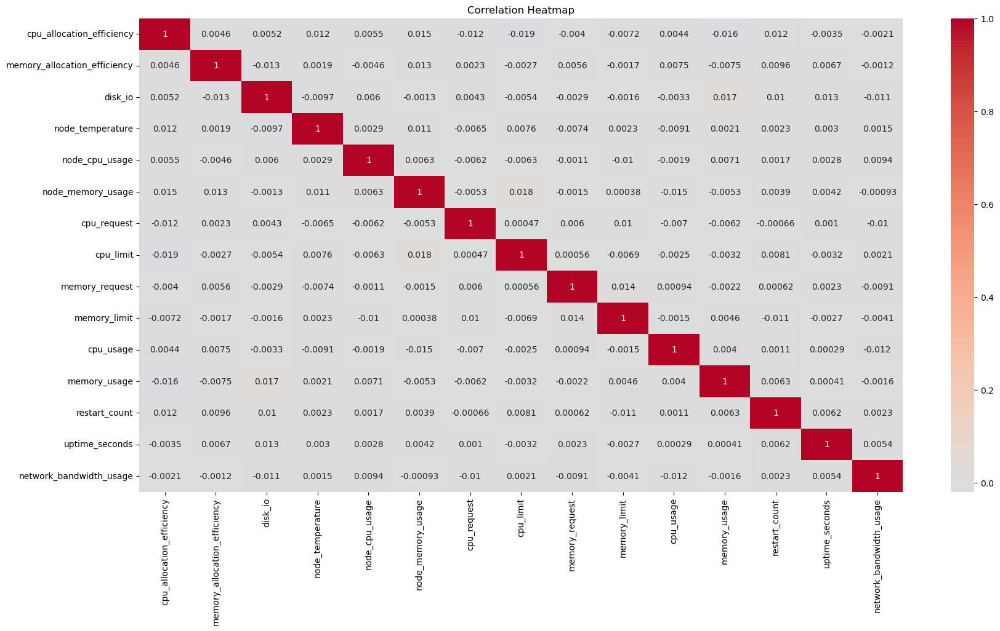

In [25]:
plt.figure(figsize=(20,10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0)
plt.title('Correlation Heatmap')
plt.show()

Display all corelations to our target variable

In [27]:
correlations = data.select_dtypes(include=['number']).corr()
target_var = "node_temperature"

print(f"Correlations with {target_var}:")
print(correlations[target_var].sort_values(ascending=False))

Correlations with node_temperature:
node_temperature                1.000000
cpu_allocation_efficiency       0.012364
node_memory_usage               0.011187
cpu_limit                       0.007553
uptime_seconds                  0.003005
node_cpu_usage                  0.002949
memory_limit                    0.002266
restart_count                   0.002261
memory_usage                    0.002089
memory_allocation_efficiency    0.001873
network_bandwidth_usage         0.001531
cpu_request                    -0.006538
memory_request                 -0.007400
cpu_usage                      -0.009067
disk_io                        -0.009712
Name: node_temperature, dtype: float64


## 5.2. Visualize data

### 5.2.1. Pairplot

Create a pairplot for all numerical features in dataset.
This pairplot shows that there are no clear correlation in the data.

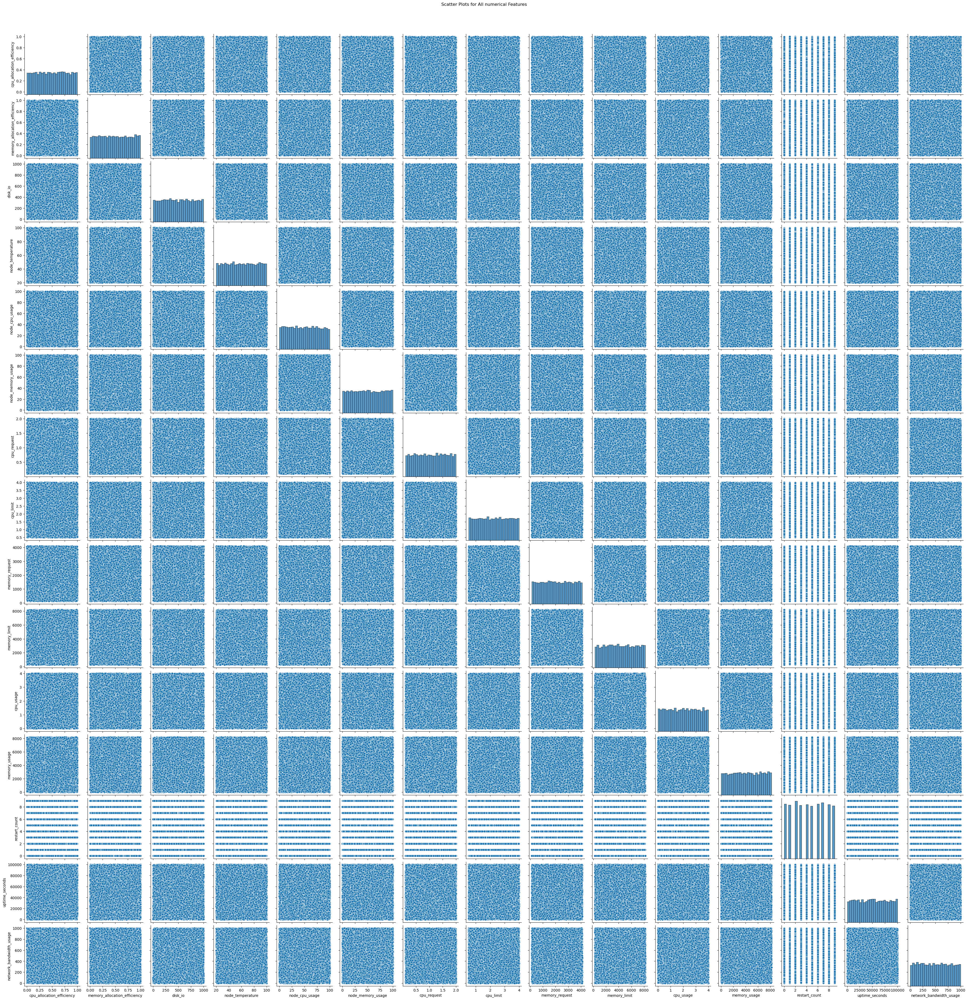

In [31]:
num_data = data.select_dtypes(include=['number'])

sns.pairplot(num_data)
plt.suptitle("Scatter Plots for All numerical Features", y=1.02)
plt.show()

### 5.2.2. Data distrubution

These plots show that the data is uniformly distributed. This would explain why there is no correlation in the data.

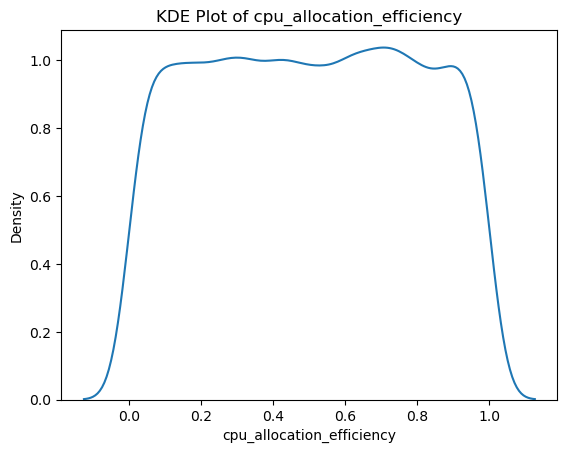

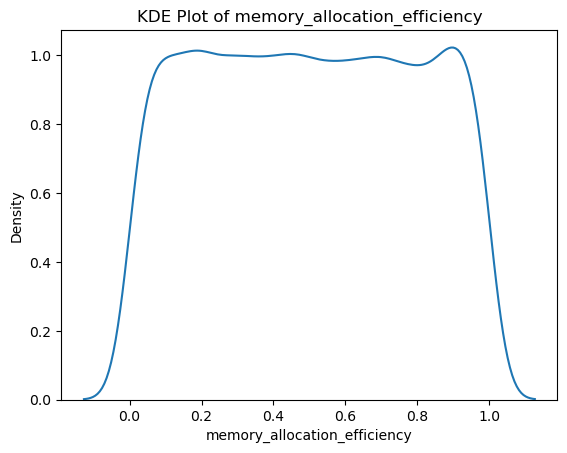

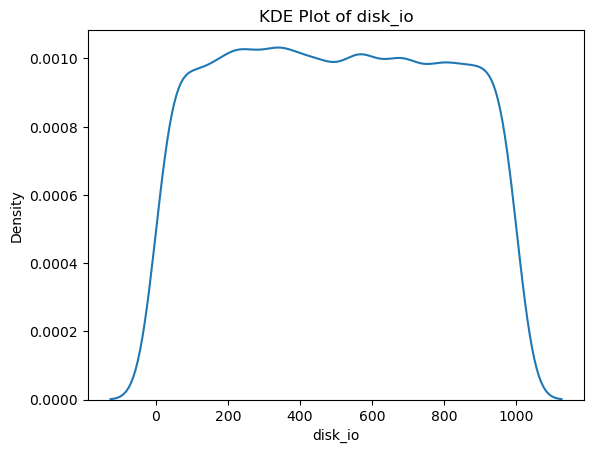

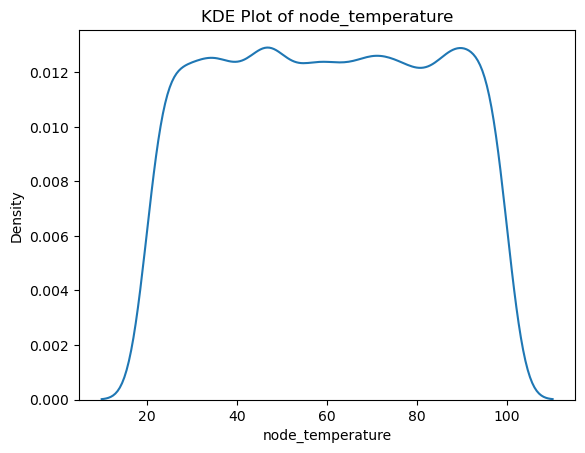

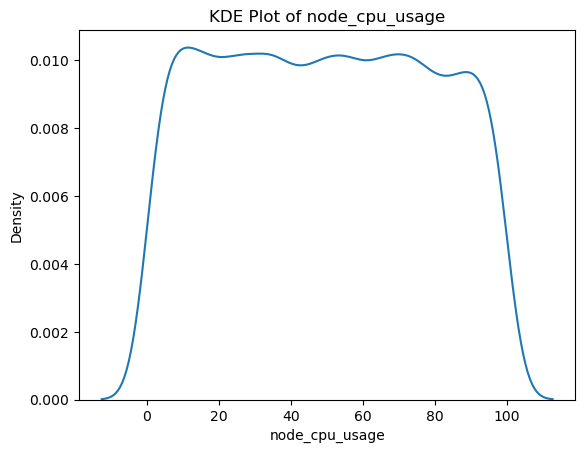

...

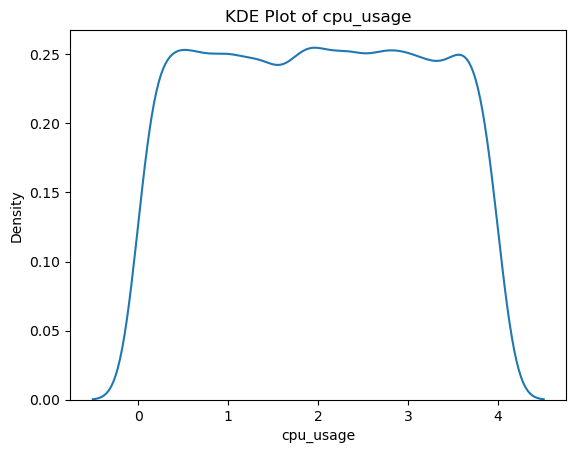

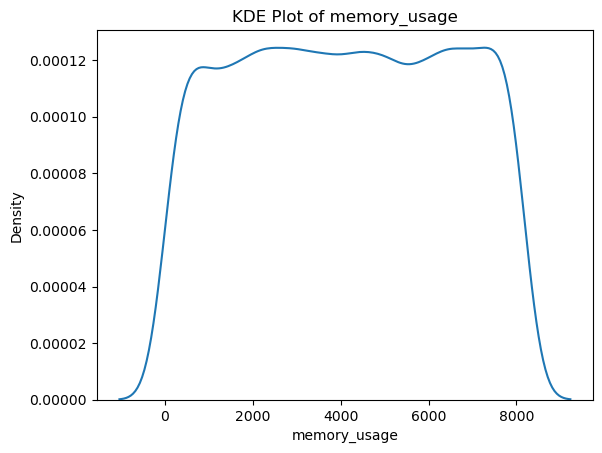

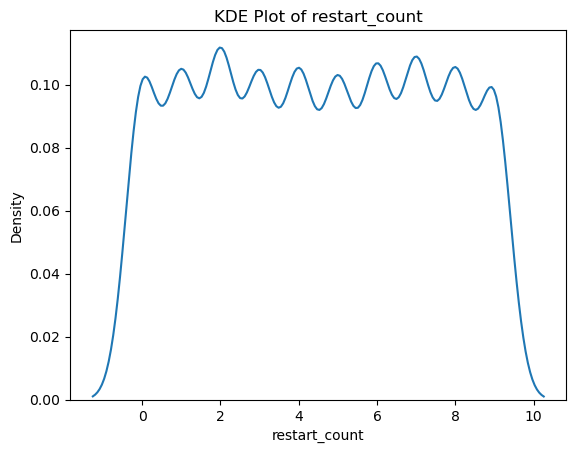

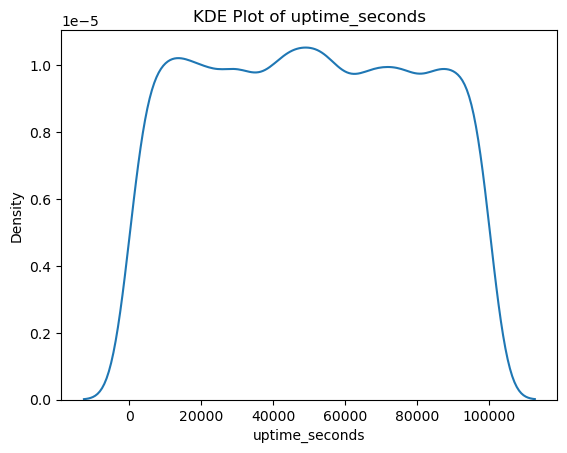

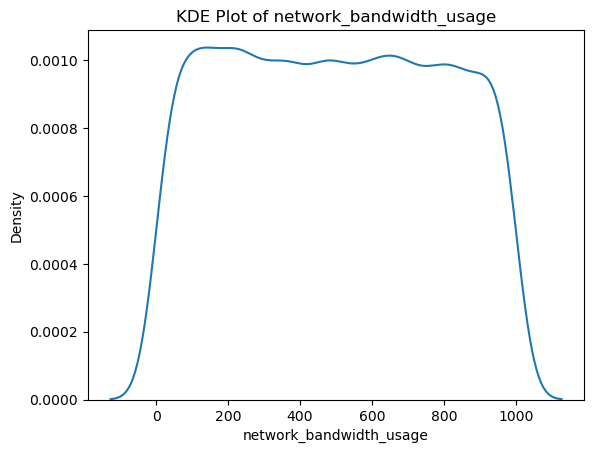

In [34]:
for col in data.select_dtypes(include=['number']).columns:
    sns.kdeplot(data[col])
    plt.title(f"KDE Plot of {col}")
    plt.show()

### 5.2.3. Contingency table

As far as we understand kubernetes event types OOMKilled is a type of warning. So for example it does not make sence that there are 939 pods that are OOMKilled but have event type "normal".

This indicates to uss that there is something wrong with event_type and event_message columns. Because of this we should remove these columns.

In [37]:
contingency_table = pd.crosstab(data['event_type'], data['event_message'])
print(contingency_table)

event_message  Completed  Failed  Killed  OOMKilled  Started
event_type                                                  
Error               1012    1037     971       1038      986
Normal               983    1055    1002        939      991
Warning             1012     990    1001        932     1051


# 6. Remove faulty colums

In [39]:
data.drop(['event_type', 'event_message'], axis=1, inplace=True)

In [40]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 15 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   cpu_allocation_efficiency     15000 non-null  float64
 1   memory_allocation_efficiency  15000 non-null  float64
 2   disk_io                       15000 non-null  float64
 3   node_temperature              15000 non-null  float64
 4   node_cpu_usage                15000 non-null  float64
 5   node_memory_usage             15000 non-null  float64
 6   cpu_request                   15000 non-null  float64
 7   cpu_limit                     15000 non-null  float64
 8   memory_request                15000 non-null  float64
 9   memory_limit                  15000 non-null  float64
 10  cpu_usage                     15000 non-null  float64
 11  memory_usage                  15000 non-null  float64
 12  restart_count                 15000 non-null  int64  
 13  u

# 7. Splitting and Scaling data

Splitting data into train and test sets, using 80% of the data for training and 20% for testing.

In [43]:
X_train, X_test, y_train, y_test = train_test_split(data.drop('node_temperature', axis=1), data['node_temperature'], test_size=0.2, random_state=42)

Scaling both the train and test sets.

In [45]:
scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)

X_test_scaled = scaler.transform(X_test)

# Converting the scaled data back to a Pandas DataFrame
X_train_scaled = pd.DataFrame(X_train_scaled, columns=data.drop('node_temperature', axis=1).columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=data.drop('node_temperature', axis=1).columns)

Defining a dict to store all model results to be able to use them later. 

In [47]:
model_results = {}

# 8. Clustering

Calculate inertia (sum of squared distances to closest cluster center) for different k

In [50]:
inertia = []

for k in range(1, 10):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_train_scaled)
    inertia.append(kmeans.inertia_)

Plotting inertia to find the 'elbow' point.

The "elbow" in the graph is the point where the rate of decrease in inertia starts to slow down. In our graph, the elbow appears to be 5 clusters.

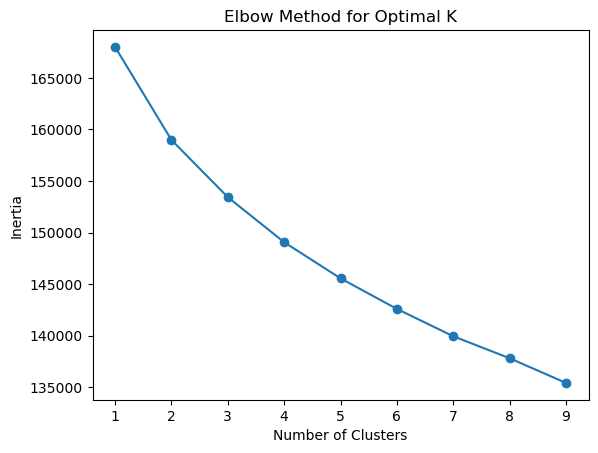

In [52]:
plt.plot(range(1, 10), inertia, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal K')
plt.show()

Apply k-means clustering with 5 clusters

In [54]:
# Set the number of clusters
kmeans = KMeans(n_clusters=5, random_state=42)

# Fit the model and predict cluster labels
train_clusters = kmeans.fit_predict(X_train_scaled)
test_clusters = kmeans.predict(X_test_scaled)

# Add the cluster labels to your original dataset for analysis
X_train_scaled['KMeans_Cluster'] = train_clusters
X_test_scaled['KMeans_Cluster'] = test_clusters

# 9. Model training

## 9.1. LinearRegression

The Mean Squared Error tells us that there is a large average squared prediction errors, suggesting the models predictions deviate substantially from actual values.

The Mean Absolute Percentage Error shows us that the model has an average high error percentage,meaning its relatively inaccurate.

Finally, the negative R-squared suggests that the model performs worse than making a prediction based on the mean.

This is likly due to the fact that all the data is uniformly distributed!

In [58]:
model = LinearRegression()
model.fit(X_train_scaled, y_train)

y_pred = model.predict(X_test_scaled)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"Mean Absolute Percentage Error: {mape}")
print(f"R-squared: {r2}")

print("Coefficients: ", model.coef_)

Mean Squared Error: 546.9655435030708
Mean Absolute Percentage Error: 0.44965583087132077
R-squared: -0.003984100023260995
Coefficients:  [ 0.55250897  0.1409716  -0.22099315  0.01569566  0.27409349 -0.22691385
  0.22183171 -0.28317963  0.25928584 -0.27017105  0.12776231  0.11104233
  0.10393604  0.10096757  0.1533791 ]


In [59]:
result = {
    "mse": mse,
    "mape": mape,
    "r2": r2,
    "model": model
}
model_results["LinearRegression"] = result

## 9.2. Polynomial

The Mean Squared Error tells us that there is a large average squared prediction errors, suggesting the models predictions deviate substantially from actual values.

The Mean Absolute Percentage Error shows us that the model has an average high error percentage,meaning its relatively inaccurate.

Finally, the negative R-squared suggests that the model performs worse than making a prediction based on the mean.

This is likly due to the fact that all the data is uniformly distributed!

In [62]:
model = make_pipeline(PolynomialFeatures(degree=2), LinearRegression())
model.fit(X_train_scaled, y_train)

y_pred = model.predict(X_test_scaled)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"Mean Absolute Percentage Error: {mape}")
print(f"R-squared: {r2}")

Mean Squared Error: 553.2715721162659
Mean Absolute Percentage Error: 0.4507357671518942
R-squared: -0.015559148099217435


In [63]:
result = {
    "mse": mse,
    "mape": mape,
    "r2": r2,
    "model": model
}
model_results["Polynomial"] = result

## 9.3. DecisionTree

The Mean Squared Error tells us that there is a large average squared prediction errors, suggesting the models predictions deviate substantially from actual values.

The Mean Absolute Percentage Error shows us that the model has an average high error percentage,meaning its relatively inaccurate.

Finally, the negative R-squared suggests that the model performs worse than making a prediction based on the mean.

This is likly due to the fact that all the data is uniformly distributed!

In [100]:
model = tree.DecisionTreeRegressor()
model.fit(X_train_scaled, y_train)

y_pred = model.predict(X_test_scaled)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"Mean Absolute Percentage Error: {mape}")
print(f"R-squared: {r2}")

Mean Squared Error: 1081.0523502629844
Mean Absolute Percentage Error: 0.557792062930022
R-squared: -0.9843285995779005


In [101]:
result = {
    "mse": mse,
    "mape": mape,
    "r2": r2,
    "model": model
}
model_results["DecisionTree"] = result

## 9.4. MLP

We used some common parameters for our MLP regressor. These are the following parameters:

We used 3 hidden layers with progressively fewer neurons. We wanted to use base 2 of the number of features. And we started with 32 nodes.
We used ReLU as a activation functon.
We used Adam as an optimizer.
We used adaptive learning rate.
We used 500 as a maximum number of iterations/epochs.


The Mean Squared Error tells us that there is a large average squared prediction errors, suggesting the models predictions deviate substantially from actual values.

The Mean Absolute Percentage Error shows us that the model has an average high error percentage,meaning its relatively inaccurate.

Finally, the negative R-squared suggests that the model performs worse than making a prediction based on the mean.

This is likely due to the fact that all the data is uniformly distributed!

In [105]:
model = MLPRegressor(
    hidden_layer_sizes=(32, 16, 8),
    activation='relu',
    solver='adam',
    learning_rate='adaptive',
    max_iter=500,
    random_state=42
)

model.fit(X_train_scaled, y_train)

y_pred = model.predict(X_test_scaled)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"Mean Absolute Percentage Error: {mape}")
print(f"R-squared: {r2}")

Mean Squared Error: 592.25461773307
Mean Absolute Percentage Error: 0.45150775225762096
R-squared: -0.08711458414933682


In [106]:
result = {
    "mse": mse,
    "mape": mape,
    "r2": r2,
    "model": model
}
model_results["MLP"] = result

## 9.5. SVR

The Mean Squared Error tells us that there is a large average squared prediction errors, suggesting the models predictions deviate substantially from actual values.

The Mean Absolute Percentage Error shows us that the model has an average high error percentage,meaning its relatively inaccurate.

Finally, the negative R-squared suggests that the model performs worse than making a prediction based on the mean.

This is likely due to the fact that all the data is uniformly distributed!

In [109]:
model = SVR(kernel='rbf')

model.fit(X_train_scaled, y_train)

y_pred = model.predict(X_test_scaled)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"Mean Absolute Percentage Error: {mape}")
print(f"R-squared: {r2}")

Mean Squared Error: 549.9498059357265
Mean Absolute Percentage Error: 0.44991678726008133
R-squared: -0.009461871097274477


In [110]:
result = {
    "mse": mse,
    "mape": mape,
    "r2": r2,
    "model": model
}
model_results["SVR"] = result

# 10. PCA

Calculate cumulative variance of the pcs

In [113]:
pca = PCA()
pca.fit(X_train_scaled)

cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

Plotting the cumulative variance with a threshold of 90%. 

90% of the total variance is explained by the first 13 components. So we can use the first 13 components for our model.

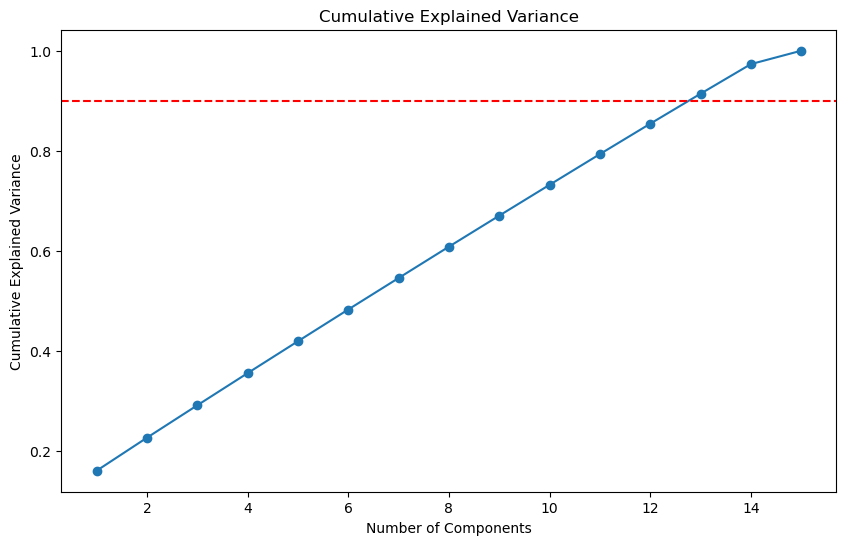

In [115]:
# Plotting
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o')
plt.title('Cumulative Explained Variance')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.axhline(y=0.90, color='r', linestyle='--')
plt.show()

This further shows that we can use the first 13 components for our model, since they explain 90% of the variance.

In [117]:
for i in range(len(cumulative_variance)):
    print(f"PC{i+1:<3} | {cumulative_variance[i]:.4f}")

PC1   | 0.1602
PC2   | 0.2262
PC3   | 0.2910
PC4   | 0.3553
PC5   | 0.4191
PC6   | 0.4825
PC7   | 0.5454
PC8   | 0.6082
PC9   | 0.6702
PC10  | 0.7318
PC11  | 0.7933
PC12  | 0.8540
PC13  | 0.9140
PC14  | 0.9732
PC15  | 1.0000


Applying PCA with 13 components

In [119]:
pca = PCA(n_components=13)

X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

# Converting the scaled data back to a Pandas DataFrame
X_train_pca = pd.DataFrame(X_train_pca)
X_test_pca = pd.DataFrame(X_test_pca)

# 11. Model training with PCA

## 11.1. LinearRegression

The Mean Squared Error tells us that there is a large average squared prediction errors, suggesting the models predictions deviate substantially from actual values.

The Mean Absolute Percentage Error shows us that the model has an average high error percentage,meaning its relatively inaccurate.

Finally, the negative R-squared suggests that the model performs worse than making a prediction based on the mean.

This is likly due to the fact that all the data is uniformly distributed!

In [123]:
model = LinearRegression()
model.fit(X_train_pca, y_train)

y_pred = model.predict(X_test_pca)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"Mean Absolute Percentage Error: {mape}")
print(f"R-squared: {r2}")

print("Coefficients: ", model.coef_)

Mean Squared Error: 546.0184091583963
Mean Absolute Percentage Error: 0.44923461593470193
R-squared: -0.0022455849852771603
Coefficients:  [-0.05627406  0.48178504 -0.14352728 -0.10921627  0.31878647 -0.0692631
 -0.1884292  -0.2081654   0.16861687  0.10653879 -0.13352031 -0.08233723
 -0.07380524]


In [124]:
result = {
    "mse": mse,
    "mape": mape,
    "r2": r2,
    "model": model
}
model_results["pca_LinearRegression"] = result

## 11.2. Polynomial

The Mean Squared Error tells us that there is a large average squared prediction errors, suggesting the models predictions deviate substantially from actual values.

The Mean Absolute Percentage Error shows us that the model has an average high error percentage,meaning its relatively inaccurate.

Finally, the negative R-squared suggests that the model performs worse than making a prediction based on the mean.

This is likly due to the fact that all the data is uniformly distributed!

In [127]:
model = make_pipeline(PolynomialFeatures(degree=2), LinearRegression())
model.fit(X_train_pca, y_train)

y_pred = model.predict(X_test_pca)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"Mean Absolute Percentage Error: {mape}")
print(f"R-squared: {r2}")

Mean Squared Error: 550.1391716915108
Mean Absolute Percentage Error: 0.44962594761736424
R-squared: -0.00980946192846055


In [128]:
result = {
    "mse": mse,
    "mape": mape,
    "r2": r2,
    "model": model
}
model_results["pca_Polynomial"] = result

## 11.3. DecisionTree

The Mean Squared Error tells us that there is a large average squared prediction errors, suggesting the models predictions deviate substantially from actual values.

The Mean Absolute Percentage Error shows us that the model has an average high error percentage,meaning its relatively inaccurate.

Finally, the negative R-squared suggests that the model performs worse than making a prediction based on the mean.

This is likly due to the fact that all the data is uniformly distributed!

In [158]:
model = tree.DecisionTreeRegressor()
model.fit(X_train_pca, y_train)

y_pred = model.predict(X_test_pca)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"Mean Absolute Percentage Error: {mape}")
print(f"R-squared: {r2}")

Mean Squared Error: 1081.6626883965832
Mean Absolute Percentage Error: 0.5555520029194613
R-squared: -0.9854489074090789


In [159]:
result = {
    "mse": mse,
    "mape": mape,
    "r2": r2,
    "model": model
}
model_results["pca_DecisionTree"] = result

## 11.4. MLP

The Mean Squared Error tells us that there is a large average squared prediction errors, suggesting the models predictions deviate substantially from actual values.

The Mean Absolute Percentage Error shows us that the model has an average high error percentage,meaning its relatively inaccurate.

Finally, the negative R-squared suggests that the model performs worse than making a prediction based on the mean.

This is likly due to the fact that all the data is uniformly distributed!

In [162]:
model = MLPRegressor(
    hidden_layer_sizes=(32, 16, 8),
    activation='relu',
    solver='adam',
    learning_rate='adaptive',
    max_iter=500,
    random_state=42
)

model.fit(X_train_pca, y_train)

y_pred = model.predict(X_test_pca)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"Mean Absolute Percentage Error: {mape}")
print(f"R-squared: {r2}")

Mean Squared Error: 558.8116077543522
Mean Absolute Percentage Error: 0.4472324081594241
R-squared: -0.025728175673748188


In [163]:
result = {
    "mse": mse,
    "mape": mape,
    "r2": r2,
    "model": model
}
model_results["pca_MLP"] = result

## 11.5. SVR

The Mean Squared Error tells us that there is a large average squared prediction errors, suggesting the models predictions deviate substantially from actual values.

The Mean Absolute Percentage Error shows us that the model has an average high error percentage,meaning its relatively inaccurate.

Finally, the negative R-squared suggests that the model performs worse than making a prediction based on the mean.

This is likly due to the fact that all the data is uniformly distributed!

In [166]:
model = SVR(kernel='rbf')

model.fit(X_train_pca, y_train)

y_pred = model.predict(X_test_pca)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"Mean Absolute Percentage Error: {mape}")
print(f"R-squared: {r2}")

Mean Squared Error: 548.8956146559424
Mean Absolute Percentage Error: 0.4493767132924665
R-squared: -0.0075268474091132465


In [167]:
result = {
    "mse": mse,
    "mape": mape,
    "r2": r2,
    "model": model
}
model_results["pca_SVR"] = result

# 12. Transform the data to normal distribution

## 12.1. Transforming data

Select all the numerical columns that we want to transform 

In [171]:
X_train_transformed = X_train_scaled.copy()
X_test_transformed = X_test_scaled.copy()

columns_to_transform = X_train_transformed.columns.difference(['KMeans_Cluster', "restart_count"])

print(columns_to_transform)

Index(['cpu_allocation_efficiency', 'cpu_limit', 'cpu_request', 'cpu_usage',
       'disk_io', 'memory_allocation_efficiency', 'memory_limit',
       'memory_request', 'memory_usage', 'network_bandwidth_usage',
       'node_cpu_usage', 'node_memory_usage', 'uptime_seconds'],
      dtype='object')


Define the QuantileTransformer and set output to normal distrubution

In [173]:
quantile_transformer = QuantileTransformer(output_distribution='normal')

Applying the transformation

In [175]:
X_train_transformed[columns_to_transform] = quantile_transformer.fit_transform(X_train_transformed[columns_to_transform])
X_test_transformed[columns_to_transform] = quantile_transformer.transform(X_test_transformed[columns_to_transform])

KDE plot to show the transformed data

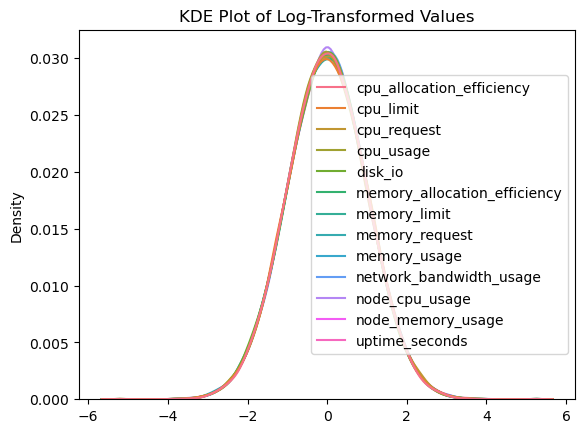

In [177]:
sns.kdeplot(X_train_transformed[columns_to_transform])
plt.title('KDE Plot of Log-Transformed Values')
plt.show()

## 12.2 Running models

### 12.2.1. LinearRegression

The Mean Squared Error tells us that there is a large average squared prediction errors, suggesting the models predictions deviate substantially from actual values.

The Mean Absolute Percentage Error shows us that the model has an average high error percentage,meaning its relatively inaccurate.

Finally, the negative R-squared suggests that the model performs worse than making a prediction based on the mean.

This is likly due to the fact that all the data is uniformly distributed!

In [181]:
model = LinearRegression()
model.fit(X_train_transformed, y_train)

y_pred = model.predict(X_test_transformed)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
linear_mape = mean_absolute_percentage_error(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"Mean Absolute Percentage Error: {linear_mape}")
print(f"R-squared: {r2}")

print("Coefficients: ", model.coef_)

Mean Squared Error: 547.0562891923731
Mean Absolute Percentage Error: 0.4497450718022657
R-squared: -0.004150668521564871
Coefficients:  [ 0.54730867  0.13891436 -0.12242675  0.1044339   0.27123648 -0.23636002
  0.20876065 -0.25355079  0.27515385 -0.21821709  0.07317588  0.11285728
 -0.01835609  0.09373748  0.12428146]


### 12.2.2. Polynomial

The Mean Squared Error tells us that there is a large average squared prediction errors, suggesting the models predictions deviate substantially from actual values.

The Mean Absolute Percentage Error shows us that the model has an average high error percentage,meaning its relatively inaccurate.

Finally, the negative R-squared suggests that the model performs worse than making a prediction based on the mean.

This is likly due to the fact that all the data is uniformly distributed!

In [184]:
poly_model = make_pipeline(PolynomialFeatures(degree=2), LinearRegression())
poly_model.fit(X_train_transformed, y_train)

y_pred = poly_model.predict(X_test_transformed)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
linear_mape = mean_absolute_percentage_error(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"Mean Absolute Percentage Error: {linear_mape}")
print(f"R-squared: {r2}")

Mean Squared Error: 554.2683795603505
Mean Absolute Percentage Error: 0.4513558003509397
R-squared: -0.01738884073074254


### 12.2.3. DecisionTree

The Mean Squared Error tells us that there is a large average squared prediction errors, suggesting the models predictions deviate substantially from actual values.

The Mean Absolute Percentage Error shows us that the model has an average high error percentage,meaning its relatively inaccurate.

Finally, the negative R-squared suggests that the model performs worse than making a prediction based on the mean.

This is likly due to the fact that all the data is uniformly distributed!

In [187]:
clf = tree.DecisionTreeRegressor()
clf = clf.fit(X_train_transformed, y_train)

y_pred = clf.predict(X_test_transformed)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
tree_mape = mean_absolute_percentage_error(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"Mean Absolute Percentage Error: {tree_mape}")
print(f"R-squared: {r2}")

Mean Squared Error: 1080.2135872434194
Mean Absolute Percentage Error: 0.5556972250346636
R-squared: -0.9827890058222548


### 12.2.4. MLP

The Mean Squared Error tells us that there is a large average squared prediction errors, suggesting the models predictions deviate substantially from actual values.

The Mean Absolute Percentage Error shows us that the model has an average high error percentage,meaning its relatively inaccurate.

Finally, the negative R-squared suggests that the model performs worse than making a prediction based on the mean.

This is likely due to the fact that all the data is uniformly distributed!

In [190]:
mlp = MLPRegressor(
    hidden_layer_sizes=(32, 16, 8),
    activation='relu',
    solver='adam',
    learning_rate='adaptive',
    max_iter=500,
    random_state=42
)

mlp.fit(X_train_transformed, y_train)

y_pred = mlp.predict(X_test_transformed)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
tree_mape = mean_absolute_percentage_error(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"Mean Absolute Percentage Error: {tree_mape}")
print(f"R-squared: {r2}")

Mean Squared Error: 593.8274662336026
Mean Absolute Percentage Error: 0.4601126994681053
R-squared: -0.09000163051823007


### 12.2.5. SVM

The Mean Squared Error tells us that there is a large average squared prediction errors, suggesting the models predictions deviate substantially from actual values.

The Mean Absolute Percentage Error shows us that the model has an average high error percentage,meaning its relatively inaccurate.

Finally, the negative R-squared suggests that the model performs worse than making a prediction based on the mean.

This is likely due to the fact that all the data is uniformly distributed!

In [193]:
svr = SVR(kernel='rbf')

svr.fit(X_train_transformed, y_train)

y_pred = svr.predict(X_test_transformed)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
tree_mape = mean_absolute_percentage_error(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"Mean Absolute Percentage Error: {tree_mape}")
print(f"R-squared: {r2}")

Mean Squared Error: 550.5720150319949
Mean Absolute Percentage Error: 0.451002609006469
R-squared: -0.01060396870646274


## 12.3. Conclusion

The reason all the models prefom bad is that the data is uniformly distrubuted. We thought that if we transformed the data into normal distrubution we would get better results. However as shown above this is not true. The reason is that the data does not get any correlations by transforming. The only thing that happens is that the data looks normaly distributed in a graph.

# 13. Model tuning

Since the PCA models did not perform better that the non-PCA models, we will use the non-PCA models for tuning. 
Except for SVR where the PCA models performed better than the non-PCA models, we will use the PCA model for SVR tuning.

## 13.1. Linear Regression

Defining the parameter grid for GridSearchCV.

In [200]:
param_grid = {
    "fit_intercept": [True, False],
}

Running GridSearchCV to find the best parameters and best model.

We use r2 as scoring because we want to find a model that has a positive r2 value.

In [202]:
model = LinearRegression()
grid_search = GridSearchCV(model, param_grid, cv=5, scoring="r2")

grid_search.fit(X_train_scaled, y_train)

best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

print("Best Parameters:", best_params)

Best Parameters: {'fit_intercept': True}


The Mean Squared Error tells us that there is a large average squared prediction errors, suggesting the models predictions deviate substantially from actual values.

The Mean Absolute Percentage Error shows us that the model has an average high error percentage,meaning its relatively inaccurate.

Finally, the negative R-squared suggests that the model performs worse than making a prediction based on the mean.

This is likly due to the fact that all the data is uniformly distributed!

In [204]:
y_pred = best_model.predict(X_test_scaled)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"Mean Absolute Percentage Error: {mape}")
print(f"R-squared: {r2}")

Mean Squared Error: 546.9655435030708
Mean Absolute Percentage Error: 0.44965583087132077
R-squared: -0.003984100023260995


In [205]:
result = {
    "mse": mse,
    "mape": mape,
    "r2": r2,
    "model": best_model
}
model_results["tuned_LinearRegression"] = result

## 13.2. Polynomial Regression

Defining the parameter grid for GridSearchCV.

In [208]:
param_grid = {
    "polynomialfeatures__degree": [2, 3, 4],
    "polynomialfeatures__interaction_only": [True, False],
}

Running GridSearchCV to find the best parameters and best model.

We use r2 as scoring because we want to find a model that has a positive r2 value.

In [210]:
model = make_pipeline(PolynomialFeatures(), LinearRegression())
grid_search = GridSearchCV(model, param_grid, cv=5, scoring="r2")

grid_search.fit(X_train_scaled, y_train)

best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

print("Best Parameters:", best_params)

Best Parameters: {'polynomialfeatures__degree': 2, 'polynomialfeatures__interaction_only': True}


The Mean Squared Error tells us that there is a large average squared prediction errors, suggesting the models predictions deviate substantially from actual values.

The Mean Absolute Percentage Error shows us that the model has an average high error percentage,meaning its relatively inaccurate.

Finally, the negative R-squared suggests that the model performs worse than making a prediction based on the mean.

This is likely due to the fact that all the data is uniformly distributed!

In [212]:
y_pred = best_model.predict(X_test_scaled)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"Mean Absolute Percentage Error: {mape}")
print(f"R-squared: {r2}")


Mean Squared Error: 552.6580314870708
Mean Absolute Percentage Error: 0.4505623018352958
R-squared: -0.014432961918484644


In [213]:
result = {
    "mse": mse,
    "mape": mape,
    "r2": r2,
    "model": best_model
}
model_results["tuned_Polynomial"] = result

## 13.3. Decision Tree Regression

Defining the parameter grid for GridSearchCV.

In [216]:
param_grid = {
    "criterion": ["squared_error", "friedman_mse", "absolute_error", "poisson"],
    "max_depth": [None, 5, 10, 20, 30],
    "max_features": [None, "sqrt", "log2"],
}

Running GridSearchCV to find the best parameters and best model.

We use r2 as scoring because we want to find a model that has a positive r2 value.

In [218]:
model = tree.DecisionTreeRegressor()
grid_search = GridSearchCV(model, param_grid, cv=5, scoring="r2")

grid_search.fit(X_train_scaled, y_train)

best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

print("Best Parameters:", best_params)

Best Parameters: {'criterion': 'friedman_mse', 'max_depth': 5, 'max_features': 'log2'}


The Mean Squared Error tells us that there is a large average squared prediction errors, suggesting the models predictions deviate substantially from actual values.

The Mean Absolute Percentage Error shows us that the model has an average high error percentage,meaning its relatively inaccurate.

Finally, the negative R-squared suggests that the model performs worse than making a prediction based on the mean.

This is likely due to the fact that all the data is uniformly distributed!

In [220]:
y_pred = best_model.predict(X_test_scaled)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"Mean Absolute Percentage Error: {mape}")
print(f"R-squared: {r2}")


Mean Squared Error: 553.6225512048583
Mean Absolute Percentage Error: 0.4515877036290643
R-squared: -0.016203388725657186


In [221]:
result = {
    "mse": mse,
    "mape": mape,
    "r2": r2,
    "model": best_model
}
model_results["tuned_DecisionTree"] = result

## 13.4. MLP Regression

Defining the parameter grid for GridSearchCV.

In [224]:
param_grid = {
    "hidden_layer_sizes": [(16), (16, 8), (32, 16, 8), (64, 32, 16)],
    "activation": ["relu", "tanh", "logistic"],
    "max_iter": [500]
}

Running GridSearchCV to find the best parameters and best model.

We use r2 as scoring because we want to find a model that has a positive r2 value.

We are aware that the model sometimes hasn't converged yet. But we are working with limited time and resources. So we have to ignore these waringing. 


In [227]:
model = MLPRegressor()
grid_search = GridSearchCV(model, param_grid, cv=5, scoring="r2")

grid_search.fit(X_train_scaled, y_train)

best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

print("Best Parameters:", best_params)

C:\Users\Tobias\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\Tobias\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\Tobias\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\Tobias\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\Tobias\anaconda3\Lib\site-packages\sklearn\neural_network\_

Best Parameters: {'activation': 'logistic', 'hidden_layer_sizes': (64, 32, 16), 'max_iter': 500}


The Mean Squared Error tells us that there is a large average squared prediction errors, suggesting the models predictions deviate substantially from actual values.

The Mean Absolute Percentage Error shows us that the model has an average high error percentage,meaning its relatively inaccurate.

Finally, the negative R-squared suggests that the model performs worse than making a prediction based on the mean.

This is likely due to the fact that all the data is uniformly distributed!

In [229]:
y_pred = best_model.predict(X_test_scaled)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"Mean Absolute Percentage Error: {mape}")
print(f"R-squared: {r2}")


Mean Squared Error: 544.8026346922599
Mean Absolute Percentage Error: 0.4489317886985885
R-squared: -1.3966837271617294e-05


In [230]:
result = {
    "mse": mse,
    "mape": mape,
    "r2": r2,
    "model": best_model
}
model_results["tuned_MLP"] = result

## 13.5. SVR Regression

Defining the parameter grid for GridSearchCV.

In [233]:
param_grid = {
    "kernel": ["linear", "poly", "rbf", "sigmoid"],
    "degree": [2, 3, 4],
}

Running GridSearchCV to find the best parameters and best model.

We use r2 as scoring because we want to find a model that has a positive r2 value.

In [235]:
model = SVR()
grid_search = GridSearchCV(model, param_grid, cv=5, scoring="r2")

grid_search.fit(X_train_pca, y_train)

best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

print("Best Parameters:", best_params)

Best Parameters: {'degree': 2, 'kernel': 'linear'}


The Mean Squared Error tells us that there is a large average squared prediction errors, suggesting the models predictions deviate substantially from actual values.

The Mean Absolute Percentage Error shows us that the model has an average high error percentage,meaning its relatively inaccurate.

Finally, the negative R-squared suggests that the model performs worse than making a prediction based on the mean.

This is likely due to the fact that all the data is uniformly distributed!

In [237]:
y_pred = best_model.predict(X_test_pca)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"Mean Absolute Percentage Error: {mape}")
print(f"R-squared: {r2}")


Mean Squared Error: 546.6086521475177
Mean Absolute Percentage Error: 0.44903813976010526
R-squared: -0.0033290071190239523


In [238]:
result = {
    "mse": mse,
    "mape": mape,
    "r2": r2,
    "model": best_model
}
model_results["tuned_SVR"] = result

# 14. Result
Conclusion - spara alla resultat för alla modeller. visa i ngn form av graph för "visualisering"

In [240]:
keys_results = []
mse_results = []
mape_results = []
r2_results = []

for x in model_results.keys():
    keys_results.append(x)
    mse_results.append(model_results[x]["mse"])
    mape_results.append(model_results[x]["mape"])
    r2_results.append(model_results[x]["r2"])

This is a bar chart that shows the mean square error for all models 

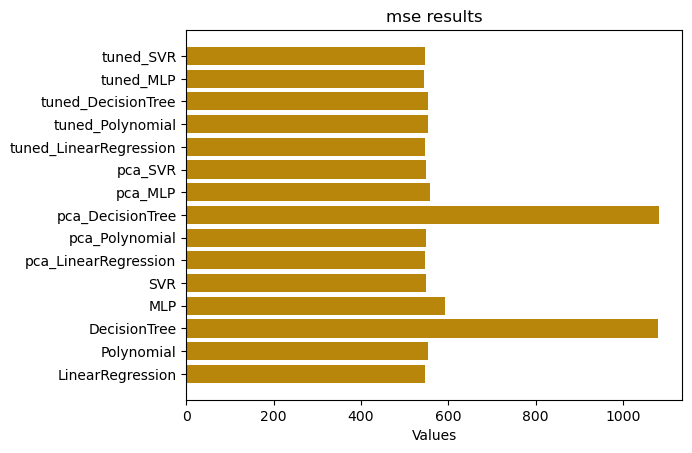

In [242]:
plt.barh(keys_results, mse_results, color='darkgoldenrod')
plt.xlabel('Values')
plt.title('mse results')
plt.show()

This is a bar chart that shows the mean absolute percentage error for all models 

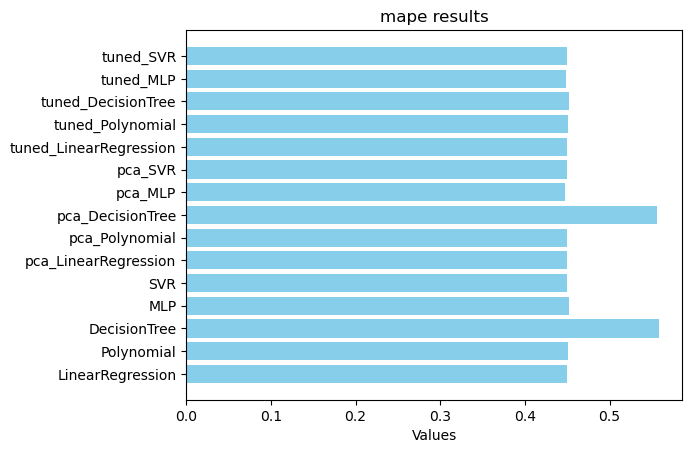

In [244]:
plt.barh(keys_results, mape_results, color='skyblue')
plt.xlabel('Values')
plt.title('mape results')
plt.show()

This is a bar chart that shows the r2 error for all models 

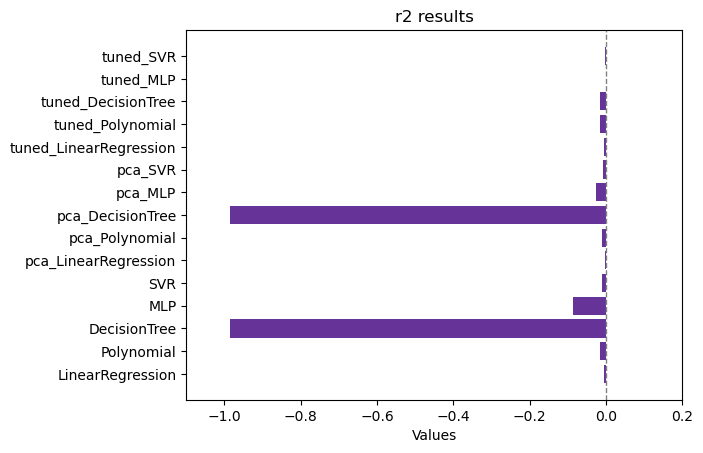

In [246]:
plt.barh(keys_results, r2_results, color='rebeccapurple')
plt.xlabel('Values')
plt.title('r2 results')
plt.xlim(-1.1, 0.2)
plt.axvline(x=0, color='gray', linestyle='--', linewidth=1)
plt.show()

Our hypothesize were that we would be able to predict node_temprature based on real-time resource usage. 

We have applied all knowledge we have gained during this course to try and make the best model possible. However, as the result shows, all the model predictions are worse than simply making a prediction based on the mean of node_temprature (i.e. r2 is less than zero).

The reason that the models preform this bad is because all the data in this dataset are uniformly destituted. Because the data is uniformly distributed there are no correlation to build a model u
on.


## 14.1. Find best model
The model that preformed best is tuned MLP. This is the one we will use for our web integration.

In [249]:
best_r2 = -2
best_mse = 0
best_mape = 0
best_model = ""

for x in model_results.keys():
    if model_results[x]["r2"] > best_r2:
        best_model = x
        best_r2 = model_results[x]["r2"]
        best_mse = model_results[x]["mse"]
        best_mape = model_results[x]["mape"]

print(f"The model that performed best is: {best_model}")
print(f"r2:  {best_r2:>17.10f}")
print(f"mse: {best_mse:>17.10f}")
print(f"mape:{best_mape:>17.10f}")

The model that performed best is: tuned_MLP
r2:      -0.0000139668
mse:    544.8026346923
mape:     0.4489317887


Dump our model

In [319]:
dump(model_results["tuned_MLP"]["model"], 'model.pkl', compress=3)

['model.pkl']

Dump our scaler

In [321]:
dump(scaler, 'scaler.pkl', compress=3)

['scaler.pkl']

Dump our cluster

In [323]:
dump(kmeans, 'cluster.pkl', compress=3)

['cluster.pkl']